In [50]:
import sys
import logging
import math

import pandas as pd
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

import statsmodels.tsa.api as tsa

from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer

pd.options.display.max_rows = 1000
pd.options.display.max_columns = 1000

%matplotlib inline

matplotlib.style.use("Solarize_Light2")

sys.path.insert(0, "/opt/vssexclude/personal/kaggle/k_tab_aug")

In [4]:
%load_ext autoreload
%autoreload 2
%config Completer.use_jedi = False

In [5]:
import src.config.constants as constants
import src.munging as process_data
import src.viz as viz
import src.common as common

In [6]:
logger = logging.getLogger()

In [7]:
train_df, test_df, submission_df = process_data.read_raw_data(logger, data_dir=constants.RAW_DATA_DIR)

In [8]:
train_df.columns

Index(['id', 'f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8',
       ...
       'f91', 'f92', 'f93', 'f94', 'f95', 'f96', 'f97', 'f98', 'f99', 'loss'],
      dtype='object', length=102)

In [9]:
train_df.head()

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99,loss
0,0,-0.002350,59,0.766739,-1.350460,42.2727,16.68570,30.3599,1.267300,0.392007,1.09101,1.96874,1.874640,117.286,6.716200,0.985656,0.973428,4004232,0.377896,1.033820,0.574531,0.122371,8.18617,1517.830,3.13219,0.112836,5.01868,116.766,10891,8.19366,5.79715,1.09999,14.86840,-0.275434,0.915721,167.800,-7.534140,4.23632,1.629560,1.144400,-0.303139,4.092090,3.22617,0.074799,0.259497,289.4920,327.4650,5.389310,7.39479,-0.489950,20.2923,2.45660,1.447720,-10639.0,85.6005,-0.178513,2815,-234.772,1.83317,88.5605,0.367916,8.575340e+09,70.9733,0.380057,0.031812,1.09527,0.563482,0.122689,1.160720,1.69391,1.07217,65.1543,0.022504,-5.6068,1.798660,0.528068,6696.300,-0.562078,1.301020,6.71624,1.143470,2.29983,0.010485,-0.127223,0.231086,4.51614,0.594494,397,0.264022,8.68790,15.070100,0.376622,-42.43990,26.854000,1.45751,0.696161,0.941764,1.828470,0.924090,2.29658,10.48980,15
1,1,0.784462,145,-0.463845,-0.530421,27324.9000,3.47545,160.4980,0.828007,3.735860,1.28138,-2.73947,-0.529506,157.670,0.696384,1.441230,0.159056,23567462,-0.089583,-0.711628,-1.045860,0.139920,3.69294,-123.354,7.74097,-0.852302,8.51025,161.175,87801,12.02020,1.78393,1.23100,10.14970,-0.018724,1.011280,127.401,11.821400,5.99681,-0.953850,1.379370,1.079530,0.711923,2.90602,0.051206,0.755122,140.8930,29.5252,14.229600,3.53213,-0.405681,42.5357,1.43533,0.939771,138312.0,59.8810,-0.070959,1435,1046.880,1.56770,29.4306,2.455150,4.518200e+09,75.5602,1.987990,0.318177,1.14901,0.723574,0.184821,-0.348303,-7.17633,1.46258,43.1121,-0.060801,64.0455,2.358450,5.759690,3958.140,1.576610,-1.241790,5.91412,0.959826,2.56631,0.000652,-0.335617,-0.271723,5.10319,8.706220,98,0.210513,7.86416,3.371900,0.147973,-184.13200,7.901370,1.70644,-0.494699,-2.058300,0.819184,0.439152,2.36470,1.14383,3
2,2,0.317816,19,-0.432571,-0.382644,1383.2600,19.71290,31.1026,-0.515354,34.430800,1.24210,2.90180,-0.960340,118.590,7.696420,1.488760,0.387277,235760,0.055568,0.268560,0.718133,0.027133,11.67340,270.247,3.44051,-0.679071,13.37810,150.362,14173,1.69954,7.04728,1.10513,7.62871,0.685721,0.809485,120.064,194.427000,6.77866,0.634136,0.934386,0.926980,0.741116,2.42205,0.260362,0.626639,369.5790,370.0240,4.488930,7.84290,1.196010,43.5343,2.59182,1.256710,168881.0,83.8419,2.713230,2911,23256.900,3.91896,97.5578,4.385380,8.444970e+08,99.4933,5.098040,0.258909,1.16878,0.049053,0.173547,0.937000,2.05947,1.22245,50.2267,-0.026215,71.6849,2.434170,1.904560,27165.800,-0.773223,-1.833390,4.98548,1.170870,1.17201,0.016848,-0.235581,-0.724935,3.22565,4.170990,105,-0.155451,8.91829,0.186334,0.335985,7.43721,37.218100,3.25339,0.337934,0.615037,2.216760,0.745268,1.69679,12.30550,6
3,3,0.210753,17,-0.616454,0.946362,-119.2530,4.08235,185.2570,1.383310,-47.521400,1.09130,-1.51200,-1.292340,125.461,7.343230,-3.092390,0.713795,1146032,0.326534,0.454842,0.219958,0.037982,5.15195,4893.860,6.89751,-0.830552,4.43184,132.855,77147,32.80900,4.06390,1.11911,3.91776,0.500353,0.206448,120.411,233.537000,7.75131,0.625762,-1.940810,1.333210,-5.793170,1.56512,0.309483,0.134558,84.8637,24.3353,4.871200,2.55104,-0.372300,14.8960,1.10013,0.892193,17006.6,78.4078,0.425686,1723,375.240,1.94539,98.1500,-0.109164,3.543970e+09,60.8082,2.357590,0.239080,1.16116,0.535797,0.222185,1.163120,2.36343,1.41530,116.1820,0.018674,55.4428,2.228240,4.303600,2643.760,-1.666320,0.792398,6.45162,1.077330,2.90676,0.023735,-0.091992,-0.098701,4.27820,5.347530,512,0.855981,8.27663,4.066650,0.336490,9.66778,0.626942,1.49425,0.517513,-10.222100,2.627310,0.617270,1.45645,10.02880,2
4,4,0.439671,20,0.968126,-0.092546,74.3020,12.30650,72.1860,-0.233964,24.399100,1.10151,1.77348,

In [10]:
test_df.head()

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99
0,250000,0.812665,15,-1.239120,-0.893251,295.5770,15.87120,23.04360,0.942256,29.898000,1.11394,-1.312220,-1.110000,128.357,7.34446,-1.03063,2.304030,13018510,0.019558,0.757686,-0.716056,0.022330,0.141964,8938.110,6.44370,1.133730,6.527050,148.030,80178,3.434410,5.53518,1.27952,8.23541,-1.306460,1.110690,153.408,50.8583,8.34922,-0.717611,1.93471,0.974460,-1.29891,2.308940,0.075320,0.491064,45.3193,21.0993,11.92580,4.01183,-1.014700,93.4686,2.47230,1.623150,28220.20,79.6277,-0.435385,1651,30.455,1.65139,90.1818,0.505812,2.726430e+09,100.6200,5.18241,0.264471,1.19025,0.566016,0.354571,1.312390,14.37410,0.839548,119.689000,-0.050117,62.5088,1.55966,2.77633,-50.0871,0.247334,0.035339,6.34367,1.17657,2.10436,0.010519,-0.393985,-0.243344,3.77018,4.63545,52,-0.144592,3.81875,-0.347570,0.446389,-422.332,-1.44630,1.69075,1.059300,-3.010570,1.94664,0.529470,1.386950,8.78767
1,250001,0.190344,131,-0.501361,0.801921,64.8866,3.09703,344.80500,0.807194,38.421900,1.09695,-5.636550,1.287090,128.250,6.69085,1.83633,0.616096,1618530,0.067314,-0.808238,-0.320105,0.998695,15.113900,1432.860,1.57510,-1.078910,2.804750,158.629,78013,0.869545,15.60280,1.24232,5.18894,-1.384710,0.893887,168.000,58.9003,6.44828,1.195220,1.94325,0.966581,-8.59752,2.671540,0.004659,0.488331,151.6100,560.8190,6.20549,5.84340,-0.857418,52.0208,1.63499,0.618007,65940.80,82.5252,0.806279,-17,3257.990,3.54311,64.7339,0.387583,6.191160e+09,112.3230,1.66891,0.292888,1.23355,0.558571,0.268359,0.980215,9.97976,1.821440,-1.325480,0.047512,20.8764,1.87620,3.72237,268.4940,-0.477587,1.693870,6.82245,1.21945,1.20199,-0.001996,-0.382959,0.124060,2.11821,5.18402,70,0.256226,18.03120,23.572300,0.377179,10352.200,21.06270,1.84351,0.251895,4.440570,1.90309,0.248534,0.863881,11.79390
2,250002,0.919671,19,-0.057382,0.901419,11961.2000,16.39650,273.24000,-0.003300,37.940000,1.15222,-3.403280,0.142553,152.386,15.08520,1.55487,1.654750,17563785,-0.166851,-1.262700,1.411200,0.003990,8.780170,4043.780,7.05112,-1.012880,10.044500,121.983,88912,-0.486979,8.97968,1.19842,8.58212,-0.293621,1.883580,120.411,110.3600,5.18177,1.365780,-1.25788,0.928871,5.28449,2.102840,0.091795,0.520486,82.0779,74.4712,6.09813,2.65875,-0.339302,110.0730,2.43819,0.013437,34353.40,93.1586,3.089920,825,464.775,1.62928,88.2927,0.099524,3.349070e+09,34.8437,5.33377,0.351806,1.38724,0.392356,0.148567,1.076470,5.34354,-2.062490,144.710000,-0.169986,39.3509,2.32312,3.01259,23.2484,0.511384,1.325380,7.33185,1.17367,1.39359,0.001120,-0.199941,0.027405,4.31420,3.24285,501,-0.141364,4.78365,0.068378,0.990140,3224.020,-2.25287,1.55100,-0.559157,17.838600,1.83385,0.931796,2.336870,9.05400
3,250003,0.860985,19,-0.549509,0.471799,7501.6000,2.80698,71.08170,0.792136,0.395235,1.20157,0.870915,1.271310,157.147,5.84885,1.38564,0.617328,252991,0.108450,0.479338,-0.719770,0.319796,25.200300,-170.328,7.52639,0.739869,0.736874,129.194,15850,11.321700,4.59213,1.38778,4.91686,-0.010639,5.175640,118.858,13.9613,2.38068,0.883522,1.28392,1.427330,3.12177,1.744060,0.269816,0.637810,133.7800,57.7544,3.81785,9.23020,-1.298150,165.7850,1.37718,1.295860,-10886.40,94.3216,-0.207208,160,447.421,1.49957,89.3567,0.897223,2.364120e+09,50.3343,2.28095,0.120234,1.19965,0.666303,0.374107,1.295360,6.90924,-0.851826,0.407165,-0.057441,41.2673,3.05986,2.84968,292.1960,-1.121020,-0.070187,12.16710,1.16699,1.72514,0.000551,-0.616739,-0.375774,6.05398,4.43417,43,-0.221611,8.38631,0.602831,1.396880,9689.760,14.77150,1.41390,0.329272,0.802437,2.23251,0.893348,1.359470,4.84833
4,250004,0.313229,89,0.588509,0.167705,2931.2600,4.34986,1.57187,1.118300,7.754630,1.16807,0.671417,1.63982

In [11]:
submission_df.head()

,id,loss
0,250000,0
1,250001,0
2,250002,0
3,250003,0
4,250004,0


In [12]:
combined_df = pd.concat([train_df.drop("loss", axis=1), test_df])

In [13]:
features = train_df.drop(["loss", "id"], axis=1).columns
len(features)

100

In [14]:
tables = [train_df, test_df]
table_names = ['train', 'test']
for name, table in zip(table_names, tables):
    print(f'============={name}==============')
    print(f'Checking Null')
    print(process_data.check_null(table))
    print(f'Checking Duplicate')
    print(process_data.check_duplicate(table, subset=features))

=============train==============
Checking Null
id      0.0
f0      0.0
f1      0.0
f2      0.0
f3      0.0
f4      0.0
f5      0.0
f6      0.0
f7      0.0
f8      0.0
f9      0.0
f10     0.0
f11     0.0
f12     0.0
f13     0.0
f14     0.0
f15     0.0
f16     0.0
f17     0.0
f18     0.0
f19     0.0
f20     0.0
f21     0.0
f22     0.0
f23     0.0
f24     0.0
f25     0.0
f26     0.0
f27     0.0
f28     0.0
f29     0.0
f30     0.0
f31     0.0
f32     0.0
f33     0.0
f34     0.0
f35     0.0
f36     0.0
f37     0.0
f38     0.0
f39     0.0
f40     0.0
f41     0.0
f42     0.0
f43     0.0
f44     0.0
f45     0.0
f46     0.0
f47     0.0
f48     0.0
f49     0.0
f50     0.0
f51     0.0
f52     0.0
f53     0.0
f54     0.0
f55     0.0
f56     0.0
f57     0.0
f58     0.0
f59     0.0
f60     0.0
f61     0.0
f62     0.0
f63     0.0
f64     0.0
f65     0.0
f66     0.0
f67     0.0
f68     0.0
f69     0.0
f70     0.0
f71     0.0
f72     0.0
f73     0.0
f74     0.0
f75     0.0
f76     0.0
f77     0.0
f78  

### Check id column

Is the id monotonic : True


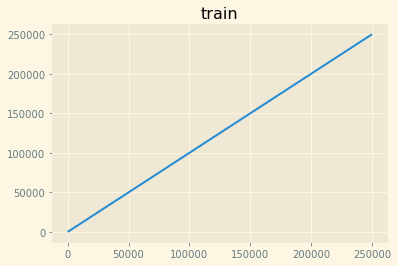

Is the id monotonic : True


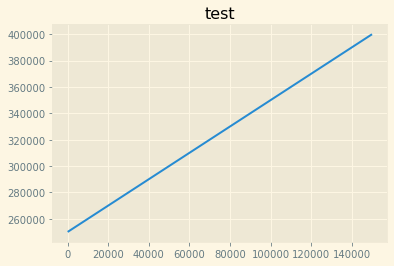

In [15]:
# Check if the id is continous or not.
for table_name, table in zip(table_names, tables):
    process_data.check_id(table, 'id', data_set_name=table_name)

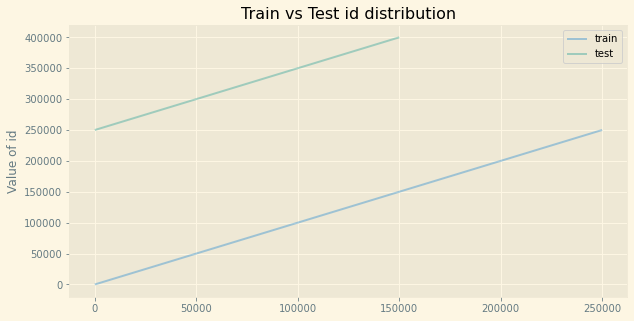

In [16]:
# Check if the id is continous or not.
viz.plot_line_train_test_overlapping(train_df, test_df, 'id')

### Check the target column

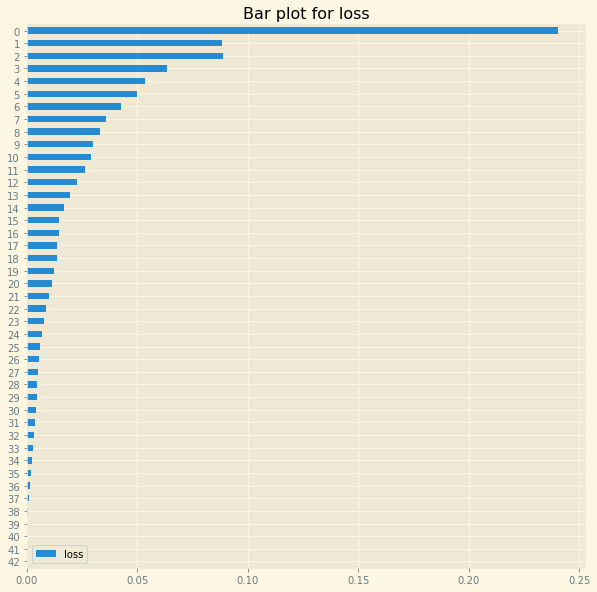

In [17]:
viz.plot_barh(df=train_df, feature_name="loss", figsize=(10, 10), sort_index=True)

In [18]:
loss_df = pd.DataFrame({"counts": train_df.loss.value_counts(), "percentage": train_df.loss.value_counts(normalize=True).mul(100)})
loss_df = loss_df.reset_index()
loss_df.columns = ["loss_value", "loss_counts", "loss_percentage"]

In [19]:
loss_df

,loss_value,loss_counts,loss_percentage
0,0,60144,24.0576
1,2,22225,8.8900
2,1,22069,8.8276
3,3,15902,6.3608
4,4,13371,5.3484
5,5,12458,4.9832
6,6,10697,4.2788
7,7,8894,3.5576
8,8,8264,3.3056
9,9,7435,2.9740


#### What is the average value of the target "loss"?

In [20]:
train_df.loss.mean()

6.81392

### Unique values of each feature (To identify the categorical features)

In [21]:
unique_count_df = pd.DataFrame({"name" : combined_df.columns, "nunique": combined_df.nunique(), "dtype": combined_df.dtypes}, )
unique_count_df["fraction"] = (unique_count_df["nunique"] / len(combined_df)).mul(100)
unique_count_df = unique_count_df.sort_values(by="fraction")
unique_count_df = unique_count_df.reset_index(drop=True)
unique_count_df

,name,nunique,dtype,fraction
0,f1,289,int64,0.07225
1,f86,329,int64,0.08225
2,f55,4892,int64,1.22300
3,f27,38897,int64,9.72425
4,f12,53664,float64,13.41600
5,f9,53958,float64,13.48950
6,f79,55602,float64,13.90050
7,f64,56368,float64,14.09200
8,f34,59358,float64,14.83950
9,f26,65140,float64,16.28500


We can start considering f1, f86, f55 as categorical features for sure.

In the same logic, can we consider, f27, f12, f9, f79, f64, f34, f26, f30 as categorical features as well. For these, uniqueness is around 9% to 16%.

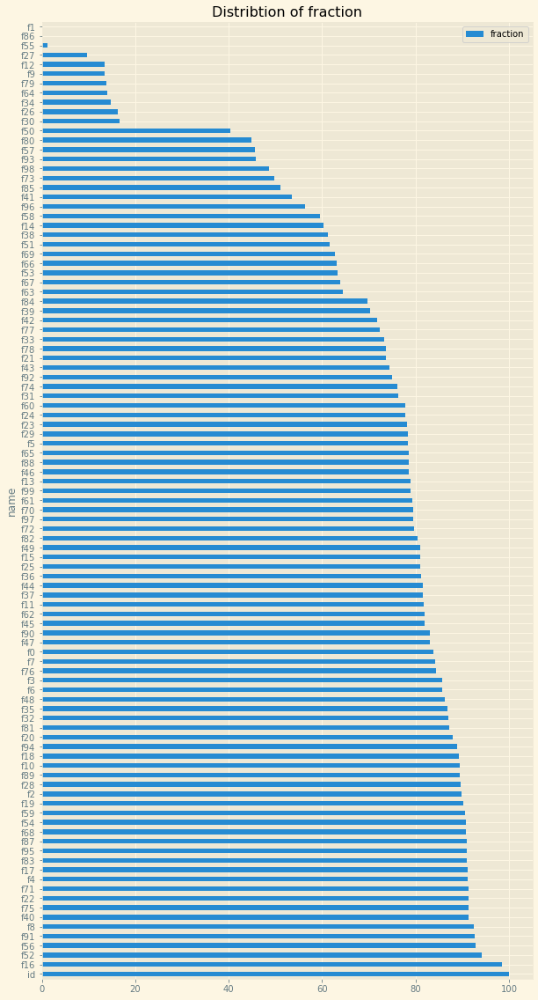

In [22]:
viz.plot_vanilla_barh(df=unique_count_df, index_name="name", feature_name="fraction", figsize=(10, 20))

### For features (f1, f86, f55), check the difference of categories between train and test data

In [23]:
for name in ["f1", "f86", "f55"]:
    train_cat_features = train_df[name].unique()
    test_cat_features = test_df[name].unique()
    print("======================")
    if len(train_cat_features) != len(test_cat_features):
        print(f"Number of categories are not same for feature {name}")
        print(f"Difference {len(train_cat_features) - len(test_cat_features)}")
        print(f"Number of categories in train data in {name} : {len(train_cat_features)}")
        print(f"Number of categories in test data in {name} : {len(test_cat_features)}")
    else:
        print(f"Number of categories for feature {name} : {len(train_cat_features)}")

Number of categories are not same for feature f1
Difference 5
Number of categories in train data in f1 : 289
Number of categories in test data in f1 : 284
Number of categories are not same for feature f86
Difference 1
Number of categories in train data in f86 : 329
Number of categories in test data in f86 : 328
Number of categories are not same for feature f55
Difference 230
Number of categories in train data in f55 : 4726
Number of categories in test data in f55 : 4496


### Even when the number of categories are same in train and test, the actual categories may differ.

In [24]:
for name in ["f1", "f86", "f55"]:
    train_cat_features = train_df[name].unique()
    test_cat_features = test_df[name].unique()
    
    diff_set_1 = set(train_cat_features) - set(test_cat_features)
    diff_set_2 = set(test_cat_features) - set(train_cat_features)
    
    if len(diff_set_1) > 0:
        print(f"For feature {name} difference between train and test: {diff_set_1}")
    if len(diff_set_2) > 0:
        print(f"For feature {name} difference between test and train: {diff_set_2}")

For feature f1 difference between train and test: {268, 272, 273, -14, -16}
For feature f86 difference between train and test: {141}
For feature f55 difference between train and test: {4098, 4103, 4105, 4106, 4109, 4111, 4117, 4124, 4127, 4128, 4129, 4131, 4132, 4133, 4135, 4140, 4141, 4145, 4146, 4147, 4148, 4150, 4161, 4163, 4166, 4167, 4168, 4170, 4171, 4172, 4175, 4181, 4184, 4187, 4188, 4190, 4195, 4197, 4199, 4205, 4207, 4209, 4210, 4213, 4216, 4219, 4223, 4225, 4237, 4246, 4247, 4256, 4265, 4274, 4276, 4277, 4278, 4282, 4285, 4287, 4292, 4294, 4297, 4300, 4308, 4309, 4311, 4316, 4321, 4322, 4323, 4327, 4328, 4334, 4341, 4347, 4354, 4356, 4359, 4360, 4361, 4364, 4365, 4368, 4371, 4382, 4384, 4386, 4387, 4391, 4392, 4393, 4394, 4397, 4400, 4401, 4402, 4403, 4406, 4408, 4413, 4420, 4424, 4426, 4429, 4430, 4432, 4436, 4438, 4442, 4443, 4444, 4448, 4449, 4452, 4453, 4455, 4457, 4460, 4462, 4470, 4472, 4475, 4481, 4484, 4487, 4489, 4491, 4493, 4494, 4500, 4502, 4503, 4512, 4513, 4520,

## Histogram of all the features

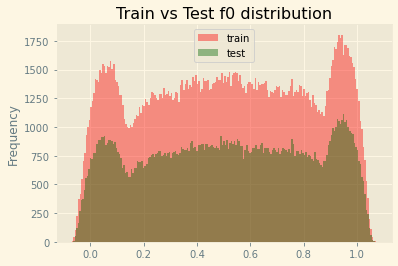

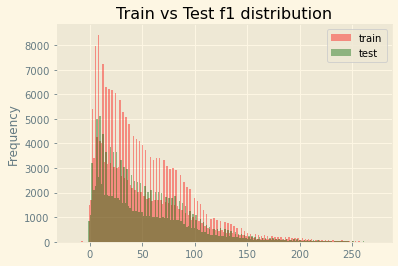

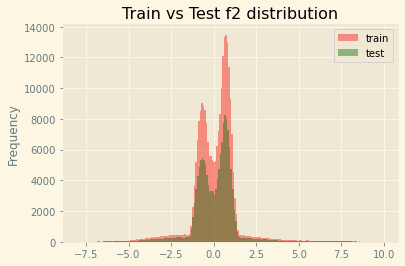

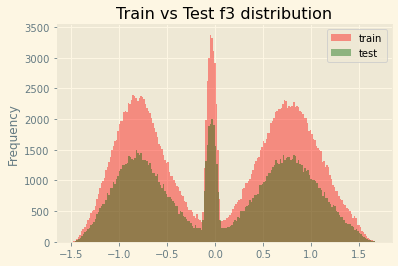

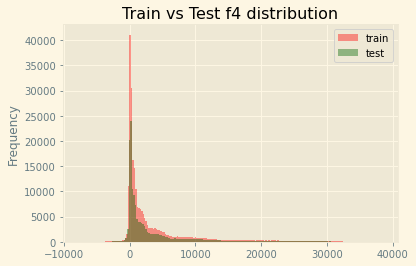

...

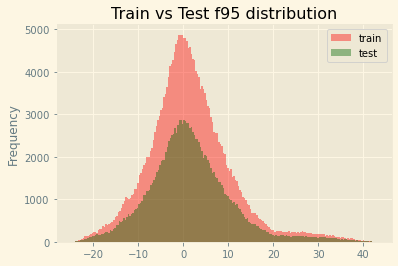

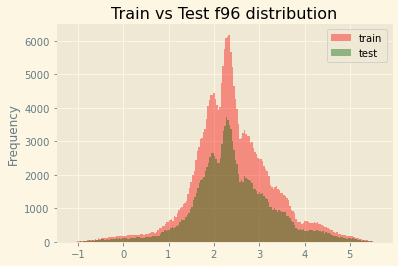

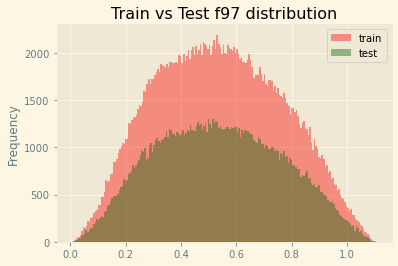

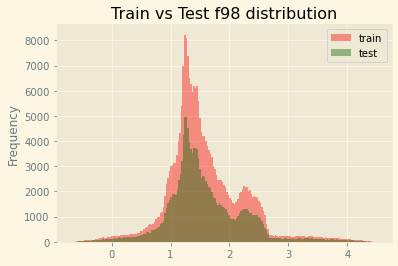

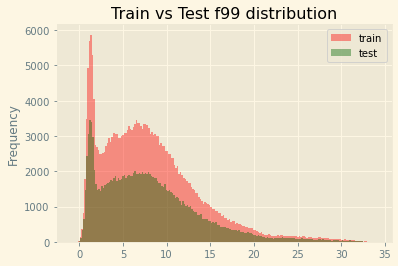

In [25]:
for name in features:
    viz.plot_hist_train_test_overlapping(train_df, test_df, name, figsize=(6, 4), bins=200)

## Boxplots of all the features

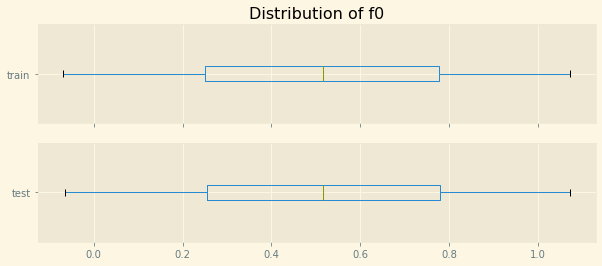

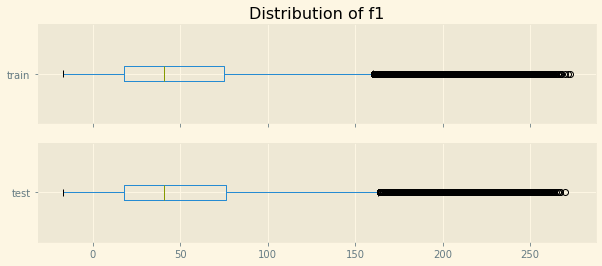

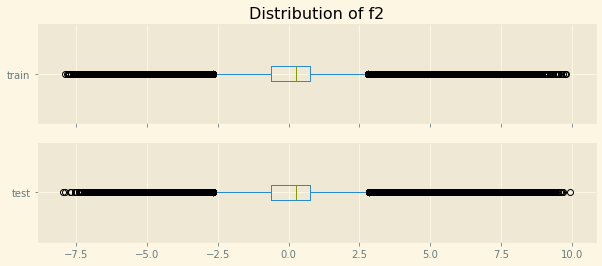

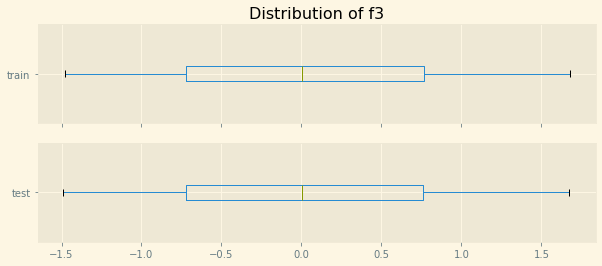

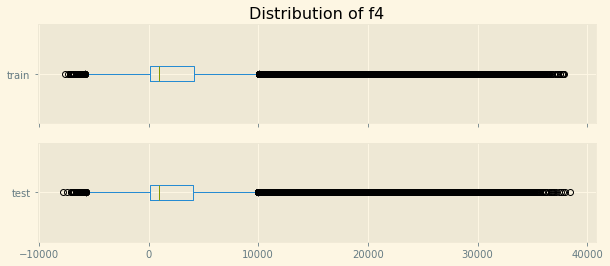

...

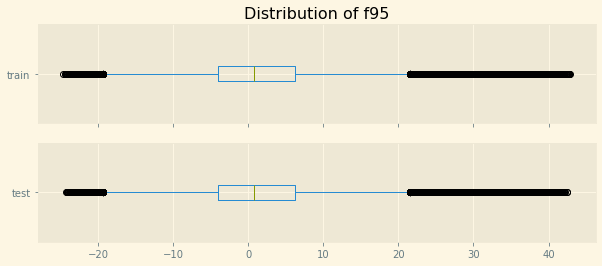

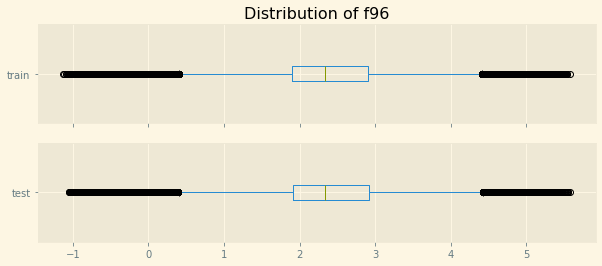

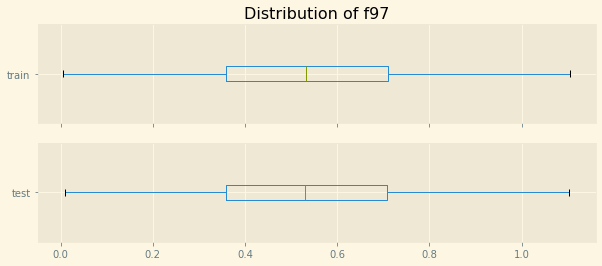

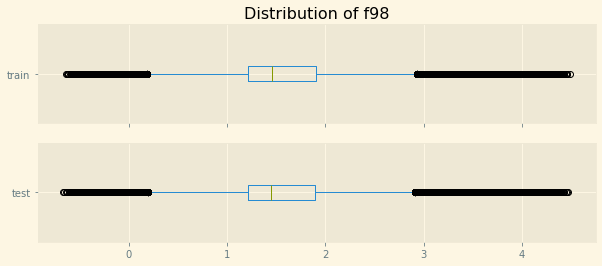

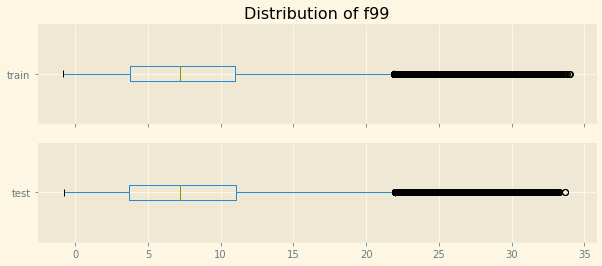

In [26]:
for name in features:
    viz.plot_boxh_train_test_overlapping(train_df=train_df, test_df=test_df, feature_name=name)

## Check the skewness of the data

In [27]:
df_skew = pd.DataFrame(train_df[features].skew())
df_skew = df_skew.reset_index()
df_skew.columns = ["feature", "skew"]

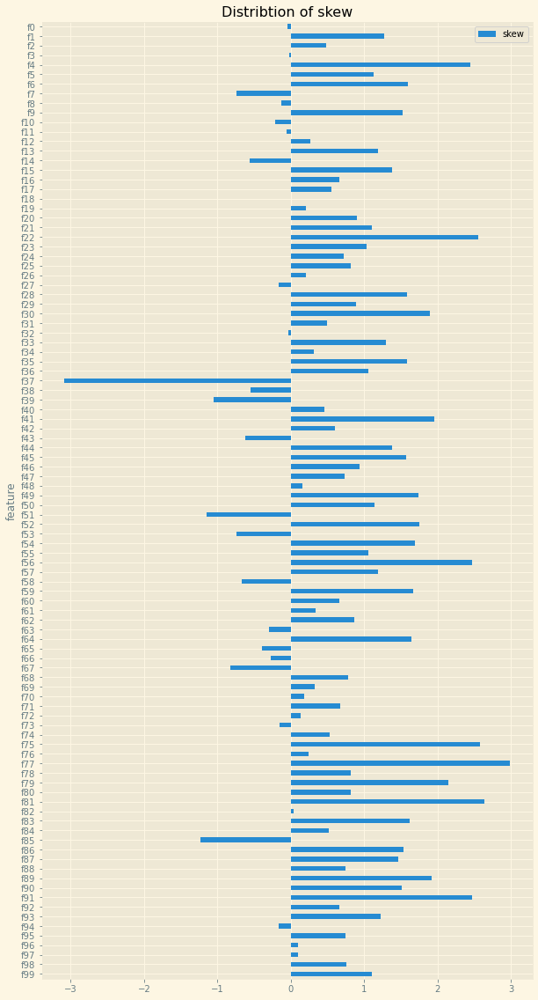

In [28]:
viz.plot_vanilla_barh(df=df_skew, index_name="feature", feature_name="skew", figsize=(10, 20))

## Check the mean value of every feature

In [29]:
df_mean = pd.DataFrame(train_df[features].mean())
df_mean = df_mean.reset_index()
df_mean.columns = ["feature", "mean"]
df_mean = df_mean.sort_values(by="mean", ascending=False)

In [30]:
with pd.option_context("display.float_format", '{:.2f}'.format):
    print(df_mean)

   feature          mean
60     f60 3882984339.67
16     f16    8891112.40
27     f27      47223.90
52     f52      18152.79
91     f91       4856.81
75     f75       4430.72
56     f56       4302.99
22     f22       3622.09
4       f4       3595.13
55     f55       1003.60
86     f86        253.14
35     f35        173.53
6       f6        164.51
26     f26        137.64
34     f34        136.83
12     f12        136.75
44     f44        115.32
45     f45        113.64
49     f49         87.84
58     f58         86.37
53     f53         85.44
70     f70         68.94
61     f61         68.26
72     f72         64.71
1       f1         51.38
92     f92         22.58
8       f8         16.67
21     f21          9.93
5       f5          8.21
99     f99          8.05
13     f13          8.03
89     f89          7.76
23     f23          7.41
29     f29          7.16
88     f88          7.15
46     f46          7.09
31     f31          6.46
78     f78          6.42
36     f36          6.28


### Check distribution of all the features in the same scale

<AxesSubplot:>

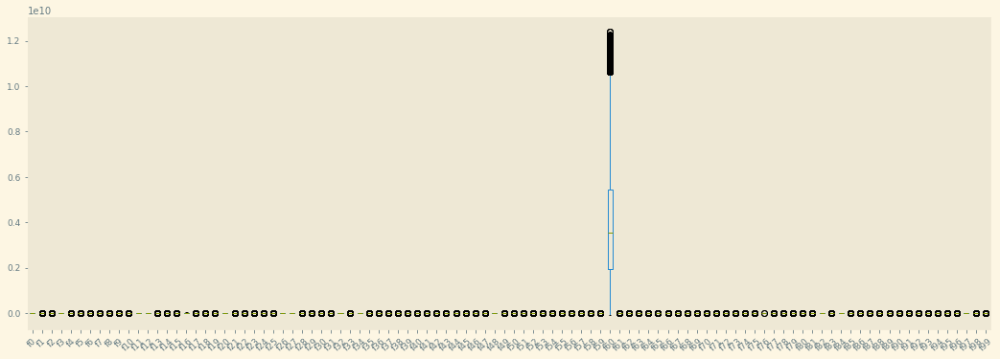

In [31]:
train_df[features].boxplot(grid=False, rot=45, fontsize=9, figsize=(18, 6))

Looks like f60 has a altogether different scale. Let's drop it

In [32]:
mod_features = [name for name in features if "f60" not in name]

<AxesSubplot:>

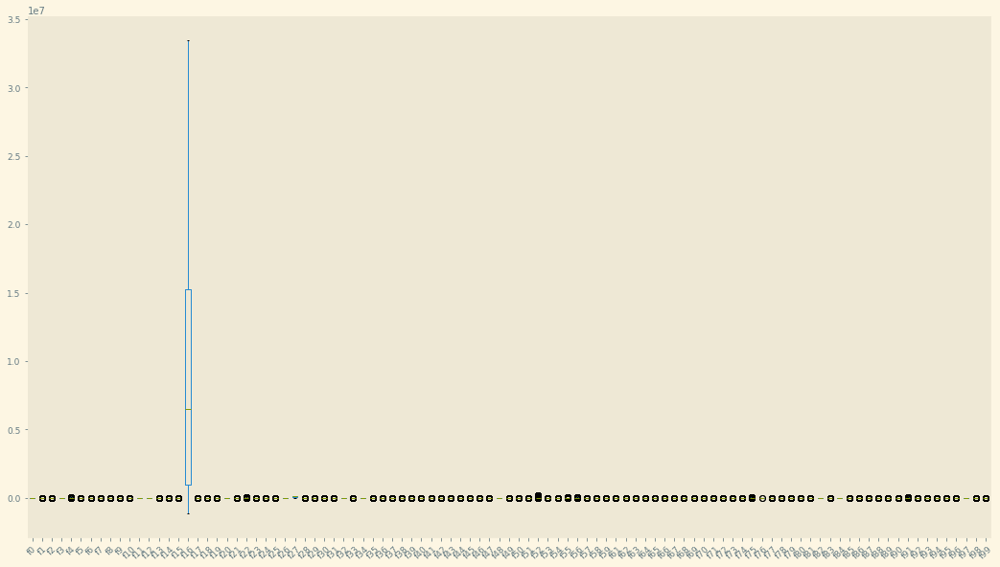

In [33]:
train_df[mod_features].boxplot(grid=False, rot=45, fontsize=9, figsize=(18, 10))

In [34]:
mod_features = [name for name in features if "f16" not in name]

<AxesSubplot:>

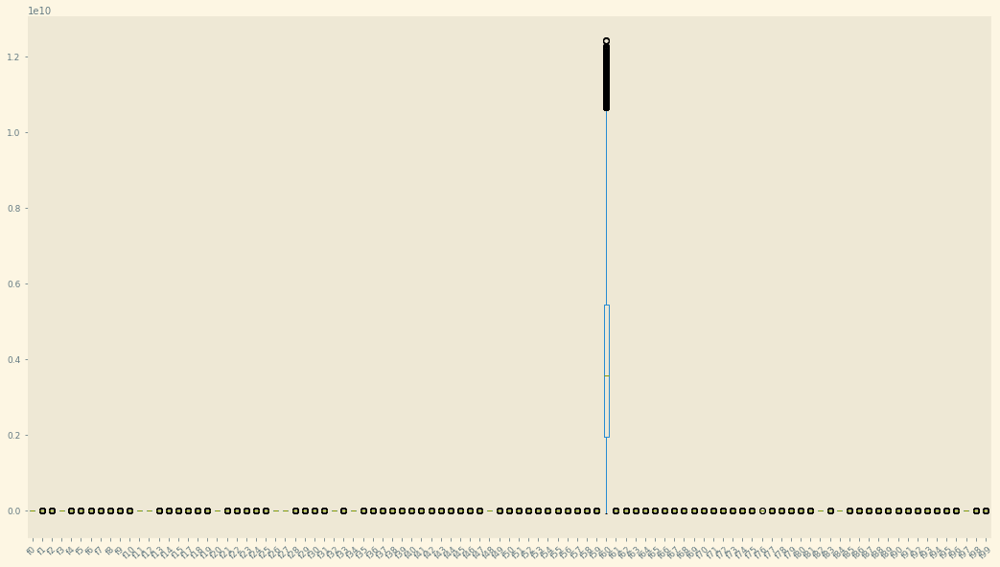

In [35]:
train_df[mod_features].boxplot(grid=False, rot=45, fontsize=9, figsize=(18, 10))

### Is there any time series feature?

From the ACF and PACF plot below, it's not

In [36]:
cat_within_2 = ["f1", "f86", "f55"]
cat_within_9 = ["f27"]
cat_within_17 = ["f12", "f9", "f79", "f64", "f34", "f26", "f30"]

cat_features = cat_within_2 + cat_within_9 + cat_within_17
cat_features

['f1', 'f86', 'f55', 'f27', 'f12', 'f9', 'f79', 'f64', 'f34', 'f26', 'f30']

In [37]:
ts_features = [name for name in combined_df.columns if name not in ["id"] + cat_within_2 + cat_within_9]

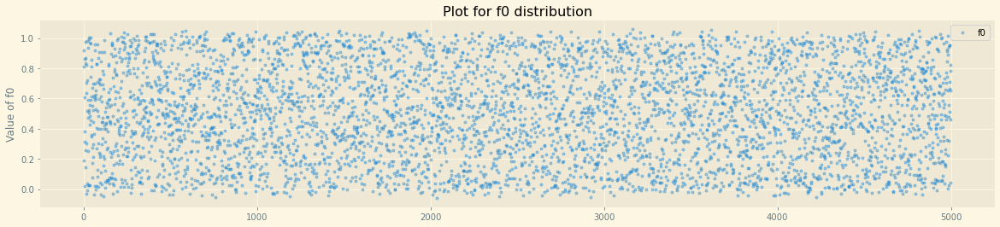

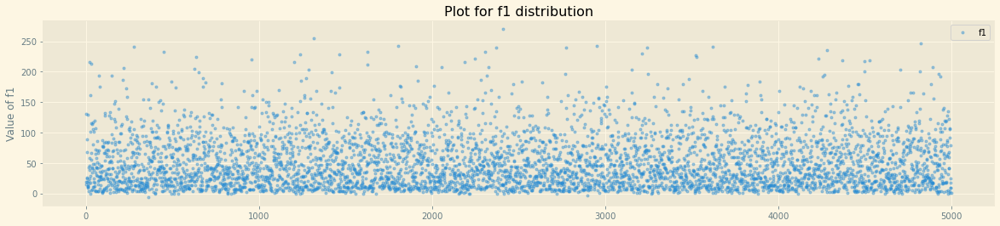

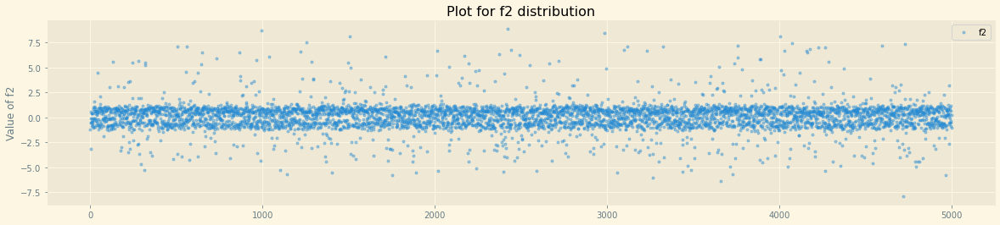

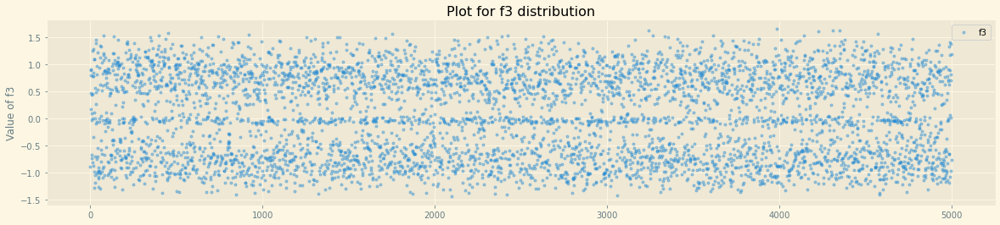

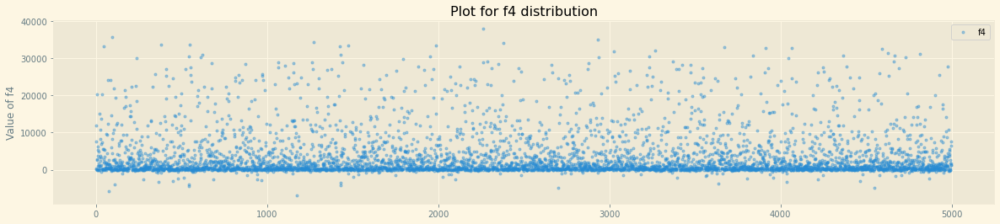

...

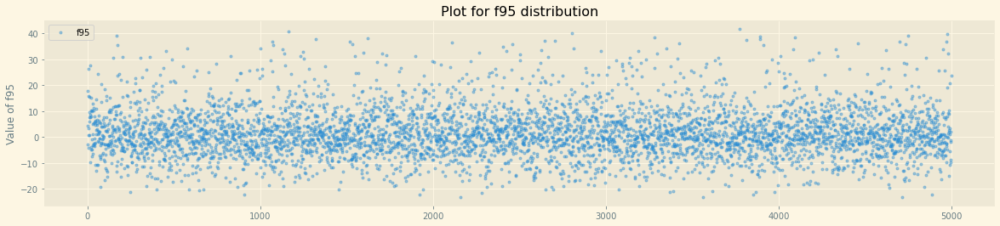

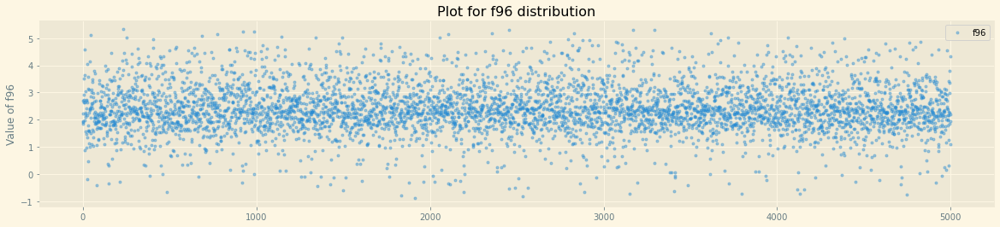

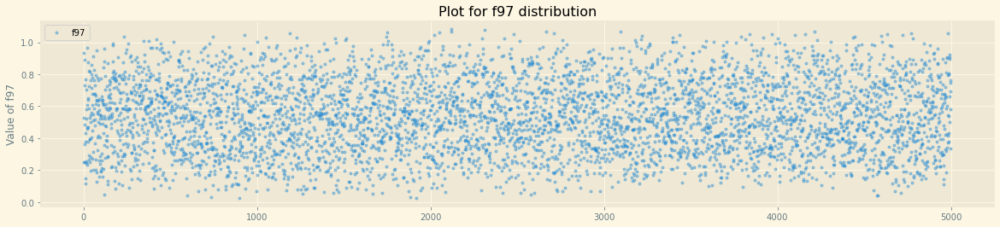

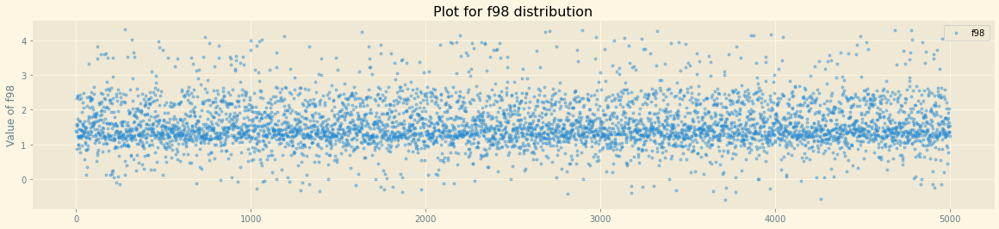

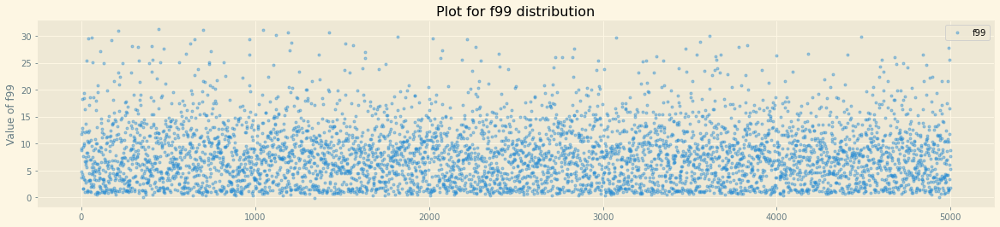

In [38]:
for name in test_df.columns.drop("id"):
    viz.plot_point(test_df[0:5000], feature_name=name, figsize=(20, 4))

### Plot ACF and PACF

For July competition, we had time series data, let's check how the ACF and PACF plot looks like

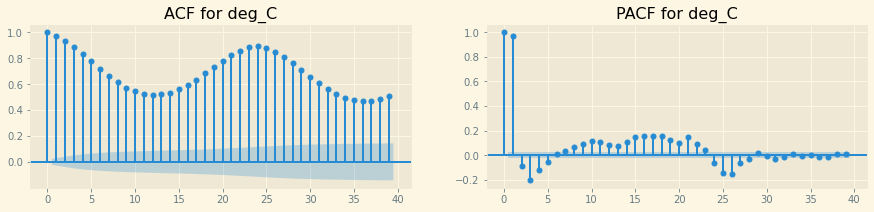

In [39]:
df_july = pd.read_parquet("/opt/vssexclude/personal/kaggle/kaggle_tab_jul/data/processed/train_processed.parquet")

df_july.head()

viz.plot_acf_pacf(df_july, "deg_C", figsize=(15, 3))

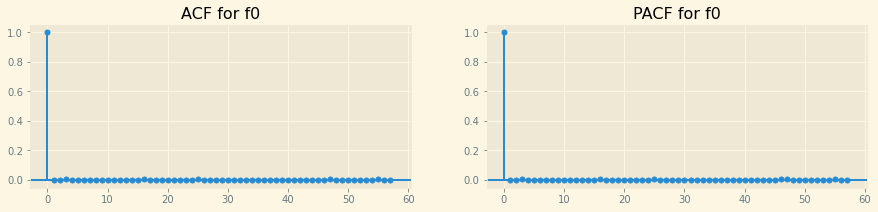

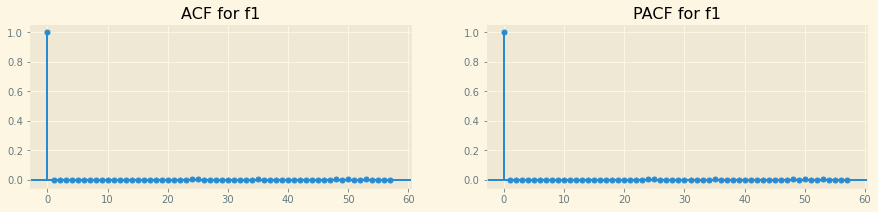

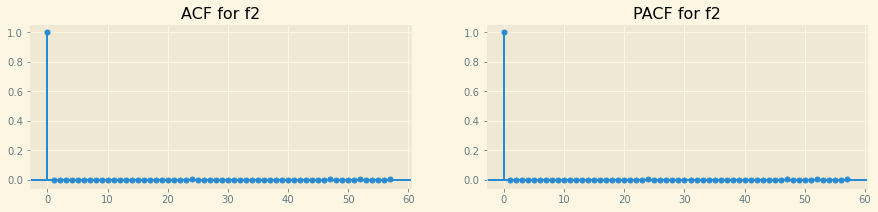

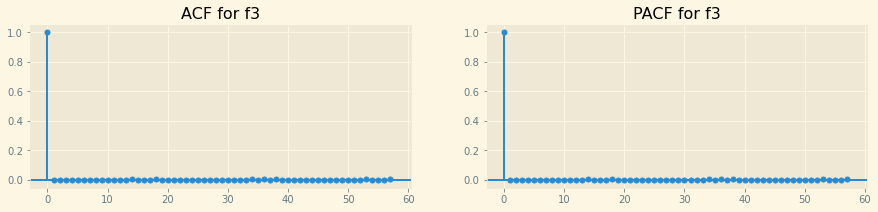

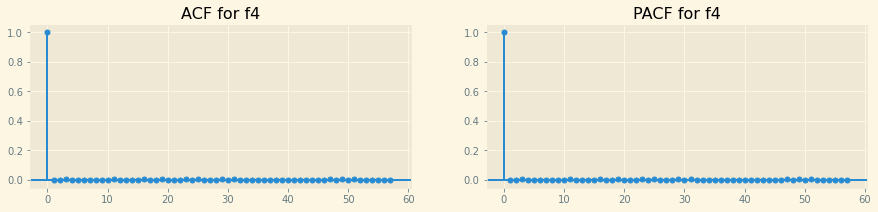

...

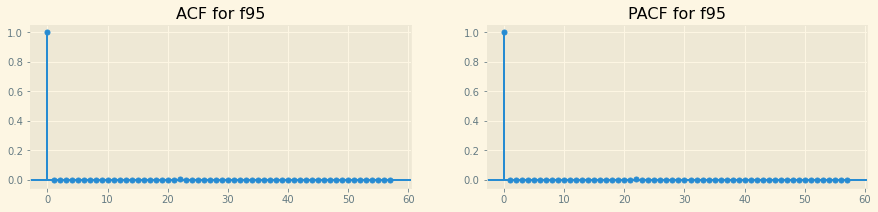

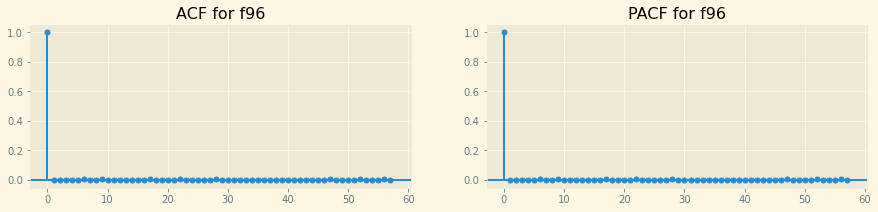

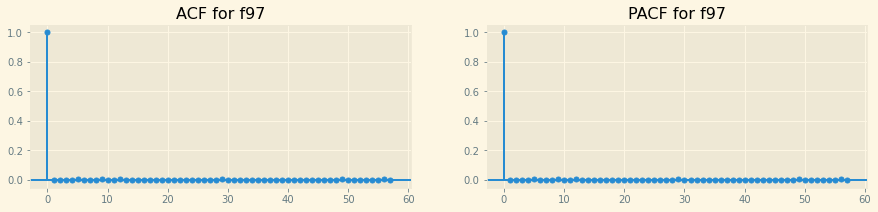

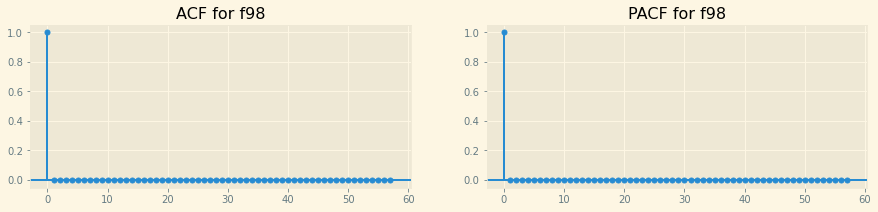

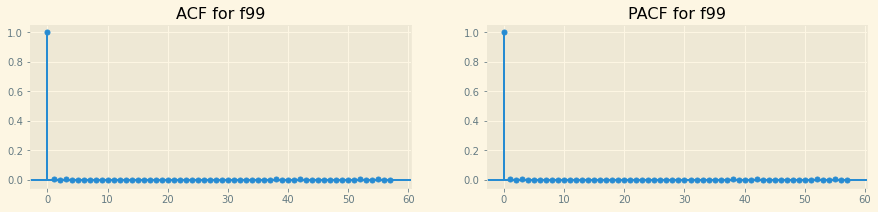

In [40]:
for name in combined_df.columns.drop("id"):
    viz.plot_acf_pacf(combined_df, name, figsize=(15, 3))

## Is there any times series per row?

In [41]:
combined_df_scaled = combined_df.copy()
for name in combined_df.drop(["id"], axis=1).columns:
    sc = StandardScaler()
    combined_df_scaled.loc[:, name] = sc.fit_transform(combined_df[[name]])

In [42]:
combined_df_min_max = combined_df.copy()
for name in combined_df.drop(["id"], axis=1).columns:
    mm = MinMaxScaler()
    combined_df_min_max.loc[:, name] = mm.fit_transform(combined_df[[name]])

In [43]:
combined_df_normalizer = combined_df.copy()
for name in combined_df.drop(["id"], axis=1).columns:
    nm = Normalizer()
    combined_df_normalizer.loc[:, name] = nm.fit_transform(combined_df[[name]])

In [44]:
combined_df_scaled.head()

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99
0,0,-1.671137,0.177281,0.496246,-1.767635,-0.584363,1.553142,-0.731537,1.094635,-0.162977,-0.995759,0.785106,1.899356,-1.349567,-0.240213,0.228371,0.350141,-0.573489,3.560954,1.450467,0.674230,-0.589953,-0.307653,-0.333928,-1.143018,0.830741,-0.324616,-1.327984,-1.009548,0.353416,-0.394107,-0.789871,3.436980,-0.325061,-0.593631,2.087584,-0.900894,-0.579959,0.851231,0.356629,-1.835008,0.411112,0.699869,-0.709585,-0.921617,1.661790,2.117935,-0.464917,0.717515,-0.497535,-0.961139,0.797530,0.876287,-0.780235,0.009444,-0.664362,2.257662,-0.609477,-0.291042,0.130203,-0.144378,2.060570,0.076248,-1.472638,-1.794594,-0.991204,0.406139,-0.949419,0.301316,0.002354,0.054349,-0.095654,0.115862,-2.241763,-0.600384,-1.534788,0.281389,-0.479535,0.171192,0.148352,-0.410130,0.472658,-0.156738,1.441034,-0.021369,0.389931,-3.492606,0.425303,0.007993,0.413593,0.639137,-0.460907,-0.576445,0.287678,-0.636031,1.047512,-0.066665,-0.661473,1.708585,1.114984,0.432579
1,1,0.885563,2.200979,-0.430131,-0.731989,3.915957,-0.864678,-0.019472,0.554427,-0.129464,0.911700,-1.150762,-0.667710,1.450397,-1.339766,0.509594,-0.948352,1.727842,-0.962261,-1.099316,-1.512573,-0.537978,-1.101648,-0.593070,0.085388,-0.523205,0.777409,1.496690,1.125981,0.849283,-1.557981,0.183230,1.508978,0.000854,-0.507502,-0.637344,-0.804866,-0.080125,-0.641919,0.487903,0.369607,-0.110595,0.439617,-0.988591,1.793029,0.242749,-0.834376,1.958873,-0.487190,-0.391215,-0.644918,-0.648712,0.134604,3.253676,-1.438370,-0.557415,0.537307,-0.436978,-0.571961,-3.346858,1.981435,0.279266,0.204974,-0.921222,1.019152,-0.453150,1.140050,-0.318823,-1.757561,-0.869698,0.190880,-0.661985,-0.808944,-0.019941,0.160568,1.172275,-0.059026,2.067391,-0.591649,-0.249590,-2.212390,0.858851,-0.541905,0.527093,-0.739134,0.758719,3.953225,-0.456699,-0.068018,0.191029,-0.386578,-0.974695,-0.593115,-0.989014,-0.359282,-0.975525,-0.390676,-1.791423,-0.433586,1.220439,-1.222851
2,2,-0.630777,-0.763974,-0.406588,-0.545359,-0.363165,2.107198,-0.727473,-1.097534,0.178165,0.518124,1.168751,-1.127740,-1.259157,-0.061171,0.538934,-0.584460,-1.016795,0.442182,0.332561,0.868028,-0.872016,0.308573,-0.530921,-1.060839,-0.280187,2.313823,0.808920,-0.918418,-0.488134,-0.031557,-0.751693,0.478933,0.895210,-0.689383,-1.132227,0.101095,0.141855,0.275900,0.239297,0.126372,-0.106089,0.046194,1.484832,1.089300,2.426578,2.539656,-0.711779,0.857274,1.629600,-0.630722,0.989018,0.597383,4.081550,-0.089552,2.211079,2.377339,2.552298,1.916131,0.659279,3.947342,-1.333688,0.876628,0.145324,0.436800,-0.255209,-1.952162,-0.433246,-0.003922,0.038293,0.106904,-0.479189,-0.424994,0.223746,0.263498,-0.822533,2.826212,-0.730983,-0.769128,-0.710300,-0.141230,-1.161820,0.092483,0.965815,-1.386099,-0.420762,-0.209706,-0.436050,-0.587881,0.475841,-0.665892,-0.552221,-0.570577,0.985827,1.360549,0.438955,-0.101952,-0.226761,0.918654,0.186468,0.754189
3,3,-0.978672,-0.811037,-0.545015,1.133072,-0.611007,-0.753599,0.116000,1.237295,-0.643172,-0.992853,-0.646065,-1.482239,-0.782766,-0.125683,-2.288980,-0.063836,-0.909715,3.063987,0.604685,0.195715,-0.839885,-0.843828,0.199146,-0.139424,-0.492693,-0.509837,-0.304629,0.830155,3.543227,-0.896767,-0.647854,-1.037314,0.659869,-1.232911,-1.108822,0.295132,0.418007,0.271060,-1.367031,0.774091,-1.114612,-0.650411,2.065724,-1.605936,-0.292301,-0.885803,-0.606970,-0.793177,-0.349099,-1.037855,-1.123396,0.065133,-0.031533,-0.395451,-0.063569,0.896338,-0.527375,-0.172291,0.694102,-0.630276,-0.148474,-0.209024,-0.794473,0.241965,-0.331502,0.279223,0.060396,0.304591,0.068176,0.174346,1.215403,0.073340,-0.294356,-0.016434,0.418832,-0.2224

In [45]:
combined_df_min_max.head()

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99
0,0,0.058629,0.262069,0.487568,0.044327,0.169648,0.520648,0.072185,0.649785,0.519117,0.206179,0.642215,0.924067,0.139886,0.241492,0.522506,0.458274,0.149490,0.861167,0.634045,0.515816,0.128709,0.295453,0.220101,0.118041,0.528319,0.293981,0.218395,0.149176,0.280389,0.242349,0.241053,0.820178,0.440549,0.192237,0.912760,0.022386,0.251121,0.772979,0.541373,0.310286,0.500728,0.469402,0.184844,0.349229,0.511717,0.513738,0.213162,0.410090,0.371040,0.121237,0.495999,0.713804,0.195370,0.612464,0.151970,0.557517,0.174446,0.288407,0.605293,0.241794,0.692794,0.415399,0.099083,0.142643,0.298365,0.536726,0.309271,0.653382,0.382454,0.499299,0.365601,0.430743,0.084651,0.544248,0.119033,0.304466,0.390744,0.461410,0.377160,0.247282,0.460085,0.358525,0.791858,0.293070,0.507918,0.308818,0.368788,0.294811,0.352668,0.297774,0.216865,0.188535,0.367411,0.260967,0.684652,0.379244,0.440822,0.835195,0.574901,0.325062
1,1,0.747917,0.558621,0.418759,0.302915,0.759722,0.176353,0.203889,0.597026,0.522567,0.449356,0.394979,0.329002,0.753923,0.080106,0.547212,0.327181,0.714358,0.304544,0.344847,0.320003,0.143570,0.146598,0.190955,0.297211,0.257788,0.425950,0.827305,0.952506,0.366381,0.063083,0.363304,0.575442,0.513549,0.204553,0.322209,0.040393,0.314166,0.643070,0.559805,0.669755,0.434068,0.453592,0.139431,0.890811,0.252134,0.067247,0.573464,0.242674,0.393030,0.160642,0.326731,0.595294,0.752811,0.407763,0.166055,0.311396,0.195799,0.220343,0.132486,0.468207,0.368560,0.437045,0.179187,0.639739,0.351203,0.681399,0.414703,0.299537,0.262655,0.510463,0.258802,0.317454,0.447597,0.643608,0.515874,0.259031,0.772076,0.434954,0.322874,0.063164,0.503037,0.332094,0.602050,0.209909,0.580289,0.879815,0.108108,0.284587,0.319350,0.156863,0.158080,0.186424,0.142704,0.307378,0.383749,0.334849,0.290536,0.394403,0.588088,0.056975
2,2,0.339111,0.124138,0.420507,0.349514,0.198651,0.599544,0.072937,0.435689,0.554232,0.399180,0.691212,0.222364,0.159713,0.267771,0.549790,0.363919,0.040679,0.477373,0.507251,0.533169,0.048060,0.410980,0.197945,0.130027,0.306345,0.609937,0.679043,0.183457,0.134451,0.298190,0.245849,0.444690,0.713871,0.178544,0.214957,0.210273,0.342165,0.722923,0.524900,0.630095,0.434644,0.429692,0.542022,0.750415,0.651618,0.577517,0.176465,0.429512,0.811000,0.162411,0.518410,0.669239,0.867214,0.598468,0.530652,0.574639,0.565840,0.823179,0.677236,0.677588,0.074969,0.549986,0.334125,0.536857,0.370641,0.071842,0.395572,0.600923,0.387391,0.503596,0.293274,0.364488,0.487405,0.657048,0.223446,0.644120,0.353096,0.428799,0.260026,0.274752,0.278299,0.375627,0.693164,0.134951,0.348827,0.560573,0.114211,0.214656,0.361987,0.118492,0.206417,0.189278,0.490290,0.595796,0.594136,0.374409,0.498640,0.672652,0.458797,0.377146
3,3,0.245318,0.117241,0.410225,0.768598,0.166155,0.192171,0.228946,0.663718,0.469688,0.206550,0.459435,0.140188,0.264186,0.258302,0.301345,0.416480,0.066962,0.800010,0.538116,0.472968,0.057247,0.194933,0.280057,0.264421,0.263885,0.271801,0.438998,0.841225,0.833556,0.164926,0.258894,0.252221,0.661158,0.100820,0.220030,0.246658,0.376997,0.722502,0.299366,0.735707,0.305780,0.387375,0.636572,0.212705,0.154258,0.059469,0.192045,0.200151,0.401741,0.111677,0.271174,0.584193,0.298832,0.555218,0.231092,0.362761,0.184609,0.317179,0.681972,0.190042,0.290702,0.367430,0.197600,0.502436,0.363149,0.511708,0.478107,0.653945,0.391497,0.509111,0.612842,0.425534,0.402770,0.620496,0.405423,0.237222,0.193855,0.456118,0.359251,0.180971,0.557912,0.394139,0.823947,0.238525,0.478585,0.643391,0.469050,0.407926,0.336033,0.165232,0.206547,0.189311,0.056456,0.267817,0.639511,0.214041,0.559772,0.556307,0.412273

In [46]:
combined_df_normalizer.head()

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99
0,0,-1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,-1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
1,1,1.0,1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,1.0,1.0,1.0,1.0
2,2,1.0,1.0,-1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
3,3,1.0,1.0,-1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0
4,4,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,1.0,1.0


In [47]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

In [48]:
train_df[train_df.loss == 15]

,id,f0,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,f17,f18,f19,f20,f21,f22,f23,f24,f25,f26,f27,f28,f29,f30,f31,f32,f33,f34,f35,f36,f37,f38,f39,f40,f41,f42,f43,f44,f45,f46,f47,f48,f49,f50,f51,f52,f53,f54,f55,f56,f57,f58,f59,f60,f61,f62,f63,f64,f65,f66,f67,f68,f69,f70,f71,f72,f73,f74,f75,f76,f77,f78,f79,f80,f81,f82,f83,f84,f85,f86,f87,f88,f89,f90,f91,f92,f93,f94,f95,f96,f97,f98,f99,loss
0,0,-0.002350,59,0.766739,-1.350460,42.2727,16.68570,30.35990,1.267300,0.392007,1.09101,1.968740,1.874640,117.286,6.71620,0.985656,0.973428,4004232,0.377896,1.033820,0.574531,0.122371,8.18617,1517.830000,3.13219,0.112836,5.01868,116.766,10891,8.193660,5.79715,1.09999,14.86840,-0.275434,0.915721,167.800,-7.53414,4.23632,1.629560,1.144400,-0.303139,4.092090,3.22617,0.074799,0.259497,289.49200,327.46500,5.38931,7.39479,-0.489950,20.2923,2.45660,1.447720,-10639.00,85.6005,-0.178513,2815,-234.7720,1.83317,88.5605,0.367916,8.575340e+09,70.9733,0.380057,0.031812,1.09527,0.563482,0.122689,1.160720,1.693910,1.072170,65.15430,0.022504,-5.60680,1.79866,0.528068,6696.3000,-0.562078,1.30102,6.71624,1.14347,2.29983,0.010485,-0.127223,0.231086,4.51614,0.594494,397,0.264022,8.68790,15.070100,0.376622,-42.4399,26.8540,1.45751,0.696161,0.941764,1.828470,0.924090,2.29658,10.48980,15
97,97,0.085584,112,-0.388073,-0.753257,-525.2720,10.66400,-1.86872,0.897345,0.254343,1.15740,-0.680437,-0.772080,121.762,33.43080,-1.368650,0.708970,11171945,0.130728,0.546990,1.178700,0.866168,25.94290,2078.290000,7.56813,-0.858000,5.26987,151.932,81114,0.798239,6.37836,1.16875,13.76200,0.733154,0.458809,161.943,76.00500,7.18285,-1.607720,-1.758560,0.890962,-3.005710,1.85061,0.065293,0.260886,117.15300,142.28000,3.39648,12.09770,-0.261308,58.6767,2.33519,1.397770,-14268.50,88.1268,-0.472300,1617,95.2820,1.72365,87.0730,-0.100769,4.674010e+09,75.9787,6.414500,0.237075,1.17628,0.103173,0.118452,0.758765,14.722800,0.962265,6.34451,0.058179,30.81170,2.18632,3.777340,33771.6000,0.861358,1.29249,7.41388,1.12090,2.29626,0.011407,-0.191001,1.831160,3.00362,4.566350,1069,-0.558631,9.54435,0.378332,0.294501,518.2150,42.5958,3.50365,-0.012647,-0.922954,0.569922,0.320728,1.31838,5.72906,15
228,228,0.920579,38,1.331040,0.337070,462.6030,10.76600,155.82100,-0.422757,-112.644000,1.23902,2.928160,-1.572300,113.567,1.42461,1.183230,0.499788,10887188,0.056291,-0.481741,-0.508496,0.330253,8.46879,164.282000,6.44543,0.017904,8.32443,134.723,83274,10.985100,6.65699,1.20197,8.20641,-0.270822,1.471940,119.042,32.94870,5.15203,0.871918,-1.455640,1.734120,-0.298562,2.24264,0.119645,0.112703,17.51830,95.95920,8.26821,9.99310,0.120499,49.0526,1.53083,1.343200,24254.10,114.1790,1.585030,430,5461.1800,4.09597,44.8996,0.369435,6.469170e+09,72.3199,1.911880,0.167850,1.11529,0.123146,0.314924,-0.417610,6.378360,1.140040,176.16600,0.152817,75.79580,3.47280,0.047920,3643.7600,0.435470,6.17632,8.05680,1.01707,1.75882,0.019106,-0.741679,0.023651,5.24350,4.568070,514,0.082813,8.90510,32.755000,0.298656,2704.0600,18.6591,1.09020,0.122539,21.611000,2.173440,0.559624,1.39275,1.00489,15
237,237,-0.016513,8,0.597449,-0.639637,983.8920,5.21053,183.51000,-1.394210,47.736700,1.61750,3.662410,1.579910,113.876,4.36671,1.249530,0.929795,260010,0.051305,-0.864597,0.308907,0.352744,3.70490,689.257000,12.04530,-1.053130,9.00685,127.096,12888,1.305930,6.87990,1.19290,3.02446,-0.772246,2.706620,134.461,48.50840,6.09788,0.468588,-0.885449,0.899960,3.468720,1.41130,0.107884,0.478726,25.08970,9.88610,12.65170,5.48968,0.804008,240.6300,2.24806,0.471214,56205.50,92.9443,-0.160318,1457,24196.6000,4.02888,103.4770,1.370220,2.564930e+09,30.6741,2.404520,0.258994,1.15529,0.349861,0.086174,-1.034900,-5.370620,1.877920,106.97600,0.028331,45.00450,1.54776,2.204020,2993.9700,0.013968,-2.70114,5.41154,1.16076,1.16490,0.007114,-0.248907,0.701390,4.45804,5.878320,39,0.831783,4.92114,5.606760,0.816231,564.2280,45.3725,1.66161,-0.517473,1.306050,4.047770,0.518980,2.50167,5.19330,15
293,293,0.826799,25,0.717934,-0.012455,-24.6753,7.03729,109.445

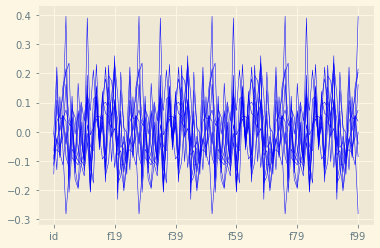

In [51]:
for k in range(0, 10):
    decomposition = tsa.seasonal_decompose(combined_df_min_max.iloc[k], model="additive", period=24)
    decomposition.seasonal.plot(color="blue", linewidth=0.5)
    plt.plot()

<AxesSubplot:>

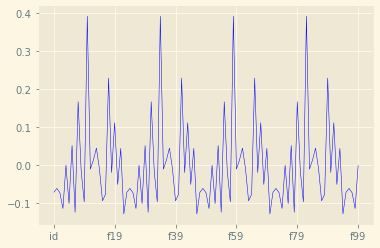

In [52]:
import statsmodels.tsa.api as tsa

decomposition = tsa.seasonal_decompose(combined_df_min_max.iloc[0], model="additive", period=24)
decomposition.seasonal.plot(color="blue", linewidth=0.5)

<AxesSubplot:>

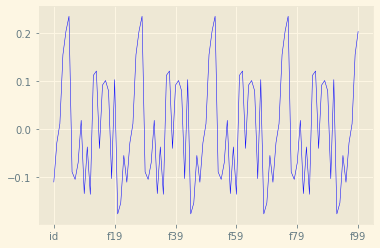

In [53]:
decomposition = tsa.seasonal_decompose(combined_df_min_max.iloc[1], model="additive", period=24)
decomposition.seasonal.plot(color="blue", linewidth=0.5)

<AxesSubplot:>

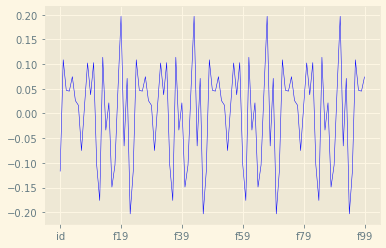

In [54]:
decomposition = tsa.seasonal_decompose(combined_df_min_max.iloc[2], model="additive", period=24)
decomposition.seasonal.plot(color="blue", linewidth=0.5)

<AxesSubplot:>

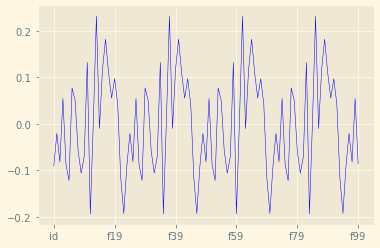

In [55]:
decomposition = tsa.seasonal_decompose(combined_df_min_max.iloc[4], model="additive", period=24)
decomposition.seasonal.plot(color="blue", linewidth=0.5)

<AxesSubplot:>

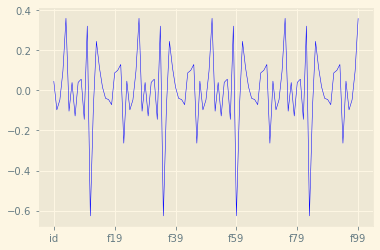

In [56]:
decomposition = tsa.seasonal_decompose(combined_df_min_max.iloc[97], model="additive", period=24)
decomposition.seasonal.plot(color="blue", linewidth=0.5)

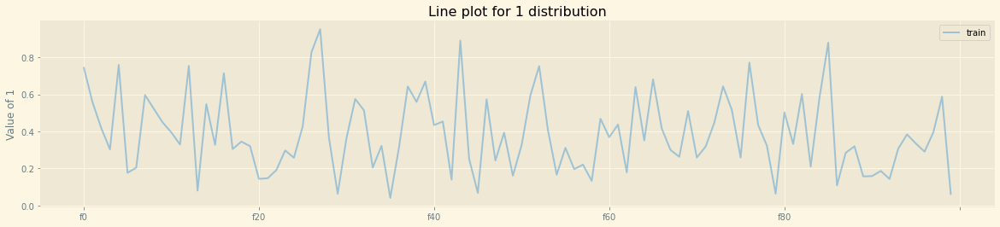

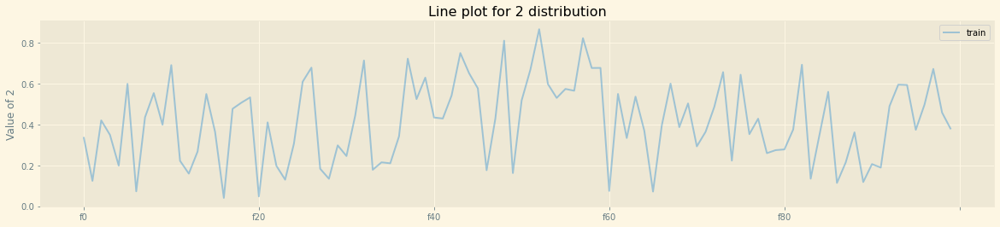

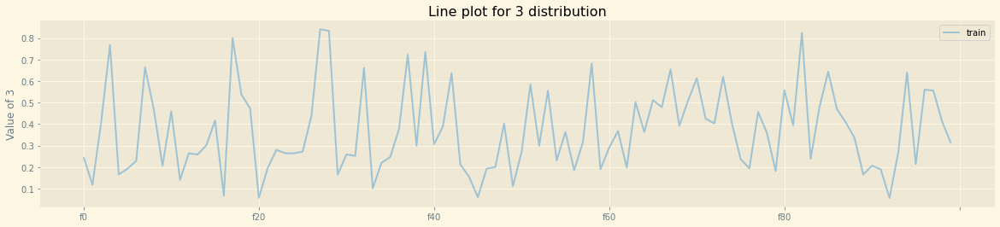

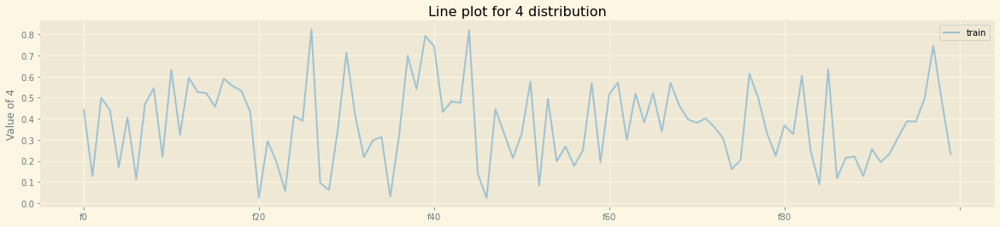

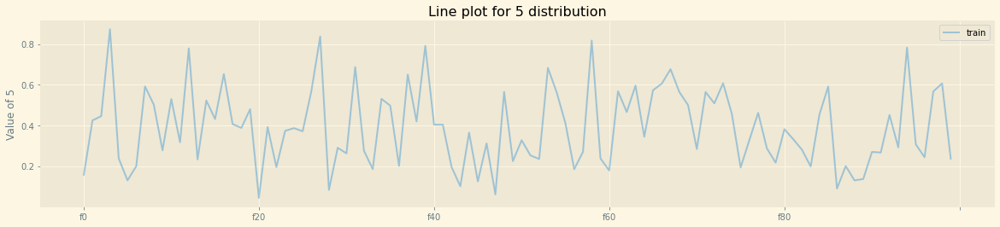

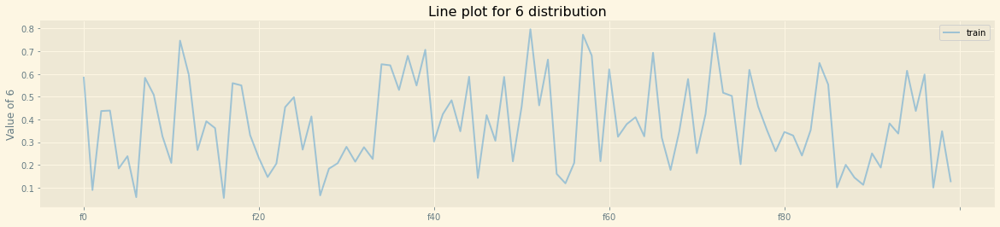

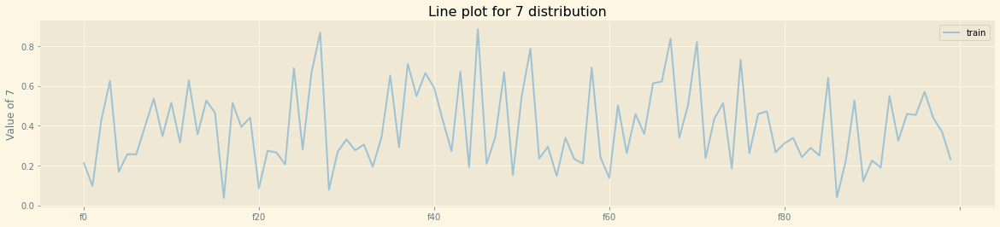

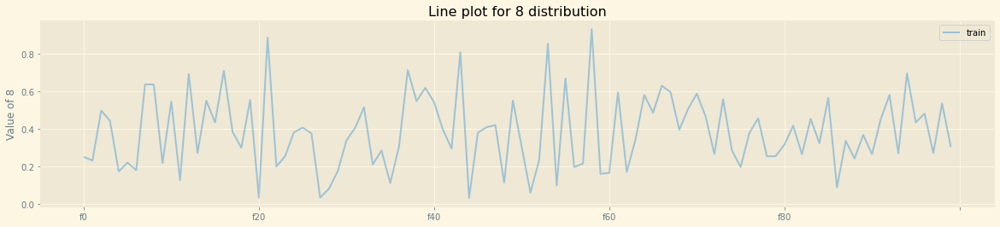

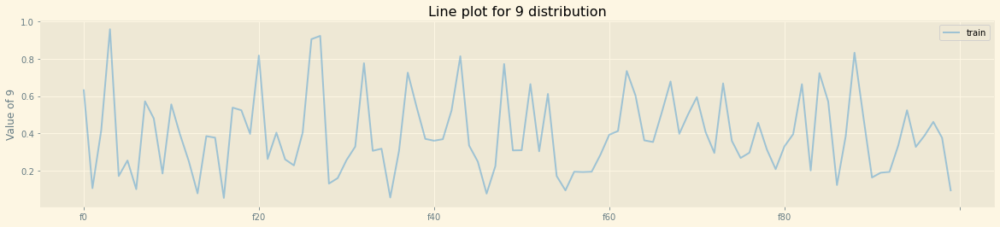

In [75]:
for i in range(1, 10):
    viz.plot_line(pd.DataFrame(combined_df_min_max.drop("id", axis=1).iloc[i]), feature_name=i, figsize=(20, 4))

/home/arnabb/anaconda3/envs/py_k/lib/python3.8/site-packages/statsmodels/graphics/utils.py:55: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


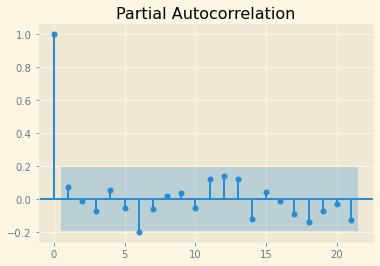

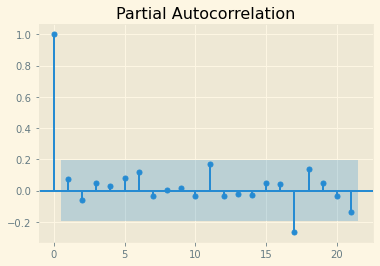

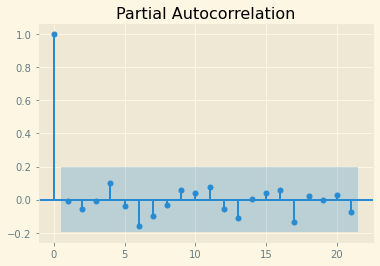

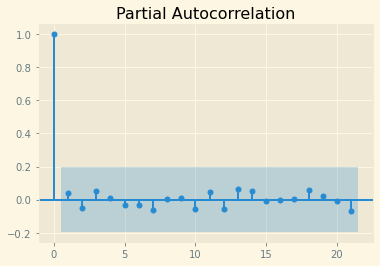

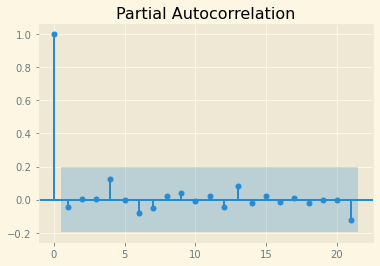

...

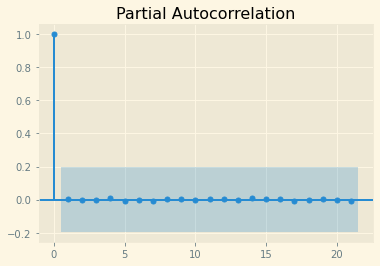

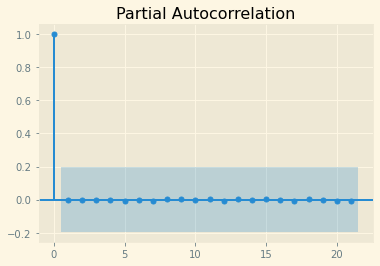

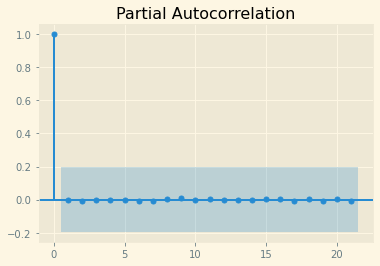

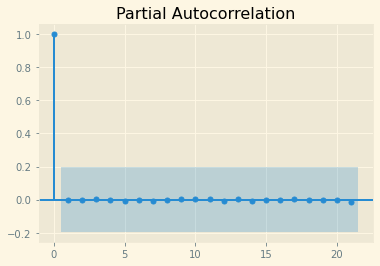

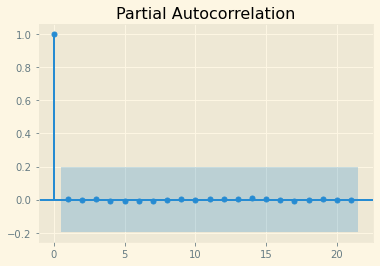

In [79]:
for i in range(1, 50):
    plot_pacf(combined_df_min_max.iloc[i])
    plt.plot()